In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import pandas as pd
import numpy as np
import re
import gc
import random
import math

from scipy.sparse import hstack, csr_matrix
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import  Image
%matplotlib inline
import pandas as pd
import seaborn as sns
import itertools
import warnings
warnings.filterwarnings("ignore")
import io
import os
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

In [185]:
df_application = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/application_train.csv.zip')
df_test = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/application_test.csv.zip')

In [186]:
df_application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [187]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

df_missing_app = missing_data(df_application)

In [188]:
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', -1) 
df_missing_app[df_missing_app['Total'] > 0]

,Total,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MEDI,210199,68.354953
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953


In [189]:
df_application.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [190]:
df_missing_app.loc['AMT_ANNUITY']

Total      12.000000
Percent    0.003902 
Name: AMT_ANNUITY, dtype: float64

In [191]:
df_missing_app.loc['AMT_GOODS_PRICE']

Total      278.000000
Percent    0.090403  
Name: AMT_GOODS_PRICE, dtype: float64


# Заполнение NaN

AMT_ANNUITY - ежемесячный(?) платёж; NaN заменяю 0, т.к. возможен другой способ выплаты кредита

AMT_GOODS_PRICE - цена товаров на который выдан потребительский кредит (для потребительских кредитов, т.е. возможно сильно коррелирует с AMT_CREDIT);
NaN заменяю 0, т.к. возможно кредит не потребительский

NAME_TYPE_SUITE - кто сопровождал клиента. NaN - 0.42% - недостаточно, чтобы стать иметь значение. Заменяю на Unaccompanied - наиболее популярный + схожий по смыслу.

OWN_CAR_AGE - возраст авто. 65% NaN! Заменяю на 0, т.к. распределение Target в группах isna() and notna is the same

OCCUPATION_TYPE - 31 % of NaN; replase to 'Undefined'

CNT_FAM_MEMBERS - number family member; 2 of NaN; replace to 0

EXT_SOURCE_1(_2; _3) - Normalized score from external data source; No obvious correlations (according sns.heatmap); replace to 0

apartment_list_float - higly correlated normalized float data with many NaN; remove the most part by correlation sort (corr > 0.7; 33 from 43); fill by group mean

apartment_list_obj - categorical data with many NaN; fillna by Undefined

social_circle_list - remove highly correleated data (> 0.8) and fill NaN by 0(?)

DAYS_LAST_PHONE_CHANGE - fillna to 0

## DAYS_EMPLOYED

max(DAYS_EMPLOYED) = 365243 days > 1000 years. Number of (DAYS_EMPLOYED > 0) = 55374 where 55362 NAME_INCOME_TYPE = Pensioner + 22 NAME_INCOME_TYPE = Unemployed

Replace value 365243 to 0 since the distribution of the Target is quite the same as for whole dataset? 

In [192]:
fillna_values = {'AMT_ANNUITY': 0, 'AMT_GOODS_PRICE': 0, 'NAME_TYPE_SUITE': 'Unaccompanied', 'OWN_CAR_AGE': 0, 'OCCUPATION_TYPE': 'Undefined', 'CNT_FAM_MEMBERS': 0, 
                 'EXT_SOURCE_1':0, 'EXT_SOURCE_2': 0, 'EXT_SOURCE_3':0,'FONDKAPREMONT_MODE': 'Undefined','HOUSETYPE_MODE': 'Undefined','WALLSMATERIAL_MODE': 'Undefined',
                 'EMERGENCYSTATE_MODE': 'Undefined','OBS_30_CNT_SOCIAL_CIRCLE':0,'DEF_30_CNT_SOCIAL_CIRCLE':0,'DAYS_LAST_PHONE_CHANGE':0,'AMT_REQ_CREDIT_BUREAU_HOUR':0,
                 'AMT_REQ_CREDIT_BUREAU_DAY':0,'AMT_REQ_CREDIT_BUREAU_WEEK':0,'AMT_REQ_CREDIT_BUREAU_MON':0,'AMT_REQ_CREDIT_BUREAU_QRT':0,'AMT_REQ_CREDIT_BUREAU_YEAR':0}

In [193]:
df_missing_app.loc['DAYS_LAST_PHONE_CHANGE']

Total      1.000000
Percent    0.000325
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [194]:
apartment_list_float = ['APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG','COMMONAREA_AVG','ELEVATORS_AVG','ENTRANCES_AVG',
                       'FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG','LIVINGAPARTMENTS_AVG','LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG',
                       'APARTMENTS_MODE','BASEMENTAREA_MODE','YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE','COMMONAREA_MODE','ELEVATORS_MODE','ENTRANCES_MODE',
                       'FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE',
                       'APARTMENTS_MEDI','BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI','COMMONAREA_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI',
                       'FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI',
                       'TOTALAREA_MODE']

apartment_list_obj = ['FONDKAPREMONT_MODE','HOUSETYPE_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE']

social_circle_list = ['OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE']

flag_document_list = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8',
                      'FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15',
                      'FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']

req_bureau_list = ['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']

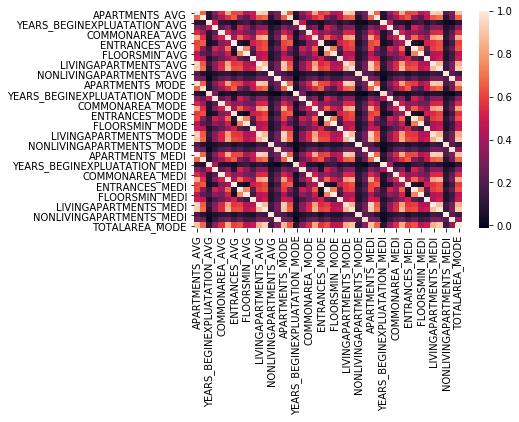

In [195]:
sns.heatmap(df_application[apartment_list_float].corr())

In [196]:
threshold = 0.7
corr_apartment_matrix = df_application[apartment_list_float].corr().abs()
upper = corr_apartment_matrix.where(np.triu(np.ones(corr_apartment_matrix.shape), k=1).astype(np.bool))
apartment_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
len(apartment_to_drop)

33

In [197]:
apartment_list_reduced = [x for x in apartment_list_float if x not in apartment_to_drop]

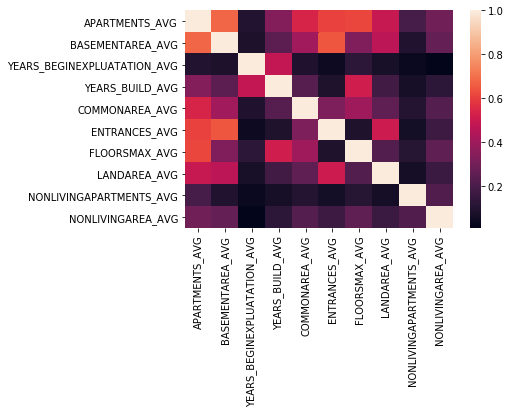

In [198]:
sns.heatmap(df_application[apartment_list_reduced].corr())

In [199]:
threshold = 0.8

corr_social_matrix = df_application[social_circle_list].corr().abs()

upper = corr_social_matrix.where(np.triu(np.ones(corr_social_matrix.shape), k=1).astype(np.bool))
social_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
len(social_to_drop)

2

In [200]:
social_circle_reduced = [x for x in social_circle_list if x not in social_to_drop]


In [201]:
df_application.drop(columns=apartment_to_drop+social_to_drop, inplace=True)

# ============ TEST =====================
df_test.drop(columns=apartment_to_drop+social_to_drop, inplace=True)

In [202]:
df_application.fillna(value=fillna_values, inplace=True)

# ============ TEST =====================
df_test.fillna(value=fillna_values, inplace=True)

In [203]:
# Create new feature if any element from 'apartement_list_reduced' is not NaN

df_application['apartment_flag'] = df_application[apartment_list_reduced].any(axis='columns').astype(int)

# ============ TEST =====================
df_test['apartment_flag'] = df_test[apartment_list_reduced].any(axis='columns').astype(int)

In [127]:
# Fill NaN in 'apartement_list_reduced' by mean in 'TARGET' groups

df_application[apartment_list_reduced] = df_application.groupby('EXT_SOURCE_3')[apartment_list_reduced].transform(lambda x: x.fillna(x.mean()))

# ============ TEST =====================
df_test[apartment_list_reduced] = df_test.groupby('EXT_SOURCE_3' )[apartment_list_reduced].transform(lambda x: x.fillna(x.mean()))

In [22]:
df_application[apartment_list_reduced] = df_application[apartment_list_reduced].transform(lambda x: x.fillna(x.mean()))
# ============ TEST =====================
df_test[apartment_list_reduced] = df_test[apartment_list_reduced].transform(lambda x: x.fillna(x.mean()))

In [205]:
missing_data(df_test)

,Total,Percent
apartment_flag,0,0.0
WEEKDAY_APPR_PROCESS_START,0,0.0
FLAG_WORK_PHONE,0,0.0
FLAG_CONT_MOBILE,0,0.0
FLAG_PHONE,0,0.0
FLAG_EMAIL,0,0.0
OCCUPATION_TYPE,0,0.0
CNT_FAM_MEMBERS,0,0.0
REGION_RATING_CLIENT,0,0.0
REGION_RATING_CLIENT_W_CITY,0,0.0


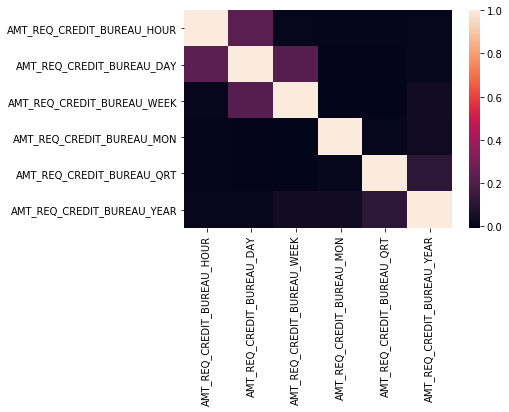

In [206]:
sns.heatmap(df_application[req_bureau_list].corr())

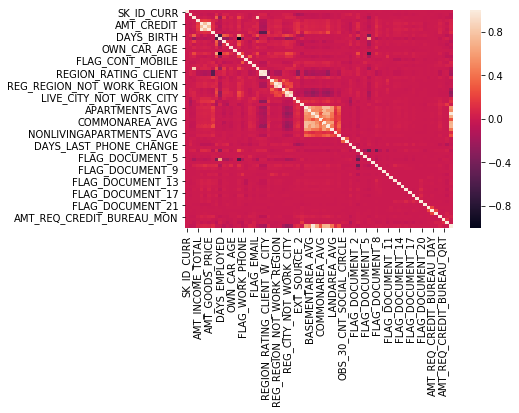

In [207]:
sns.heatmap(df_application.corr())

In [208]:
threshold = 0.9

corr_matrix = df_application.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
list_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
list_to_drop

['AMT_GOODS_PRICE',
 'FLAG_EMP_PHONE',
 'REGION_RATING_CLIENT_W_CITY',
 'apartment_flag']

In [209]:
df_application.drop(columns = list_to_drop, inplace=True)
df_test.drop(columns = list_to_drop, inplace=True)

In [210]:
df_application['credit_term'] = df_application['AMT_ANNUITY'] / df_application['AMT_CREDIT']
df_application['credit_income_percent'] = df_application['AMT_CREDIT'] / df_application['AMT_INCOME_TOTAL']
df_application['annuity_income_percent'] = df_application['AMT_ANNUITY'] / df_application['AMT_INCOME_TOTAL']
df_application['days_employed_percent'] = df_application['DAYS_EMPLOYED'] / df_application['DAYS_BIRTH']

In [211]:
df_test['credit_term'] = df_test['AMT_ANNUITY'] / df_test['AMT_CREDIT']
df_test['credit_income_percent'] = df_test['AMT_CREDIT'] / df_test['AMT_INCOME_TOTAL']
df_test['annuity_income_percent'] = df_test['AMT_ANNUITY'] / df_test['AMT_INCOME_TOTAL']
df_test['days_employed_percent'] = df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']

## Separation of the indexes of main dataframe to train and test parts

In [27]:
# Split df_application to train and test parts by indexes. 

app_test_index = sorted(random.sample(df_application.index.tolist(), int(df_application.shape[0]*0.2)))

# Too slowly!!!
#app_train_index = [i for i in df_application.index and i not in app_test_index]

app_train_index = list(set(df_application.index) - set(app_test_index))

# Categorical features preprocessing

In [30]:
# Function for categorical data preprocessing using "high cardinalyty" method. Target column is required
def high_cardinality_encoding(df, target, col):
    
    y_mean_prior = df[target].mean()
    y_var_prior = df[target].var()
    
    Yi = list(df[~df[target].isnull()].groupby(col)[target].mean())
    Ni = list(df[~df[target].isnull()].groupby(col).size())
    col_values = set(df[col][~df[target].isnull()])
    var_col_values_gen = (df[target][(~df[target].isnull()) & (df[col] == v)].var() for v in col_values)
    var_col_values = [0 if math.isnan(x) else x for x in var_col_values_gen]
    
    val_dict = { attr : ( ((n_cell*y_var_prior)/(var_cell + n_cell*y_var_prior)) * y_mean_cell + (1 - ((n_cell*y_var_prior)/(var_cell + n_cell*y_var_prior))) * y_mean_prior ) 
                for attr, n_cell, y_mean_cell, var_cell in zip(col_values, Ni, Yi, var_col_values)}
    
    return val_dict

# Function for categorical data preprocessing by calculating simple probability of each value
def frequency_encoding(df, col):
    return dict(df.groupby(col).size()/df.shape[0])

# Label encoding
def label_encoding(df, col):
    return {v: i for i, v in enumerate(set(df[col]))}

In [212]:
# Categorical features of 'object' type
df_application[df_application.columns[df_application.dtypes == 'object']].nunique()

NAME_CONTRACT_TYPE            2 
CODE_GENDER                   3 
FLAG_OWN_CAR                  2 
FLAG_OWN_REALTY               2 
NAME_TYPE_SUITE               7 
NAME_INCOME_TYPE              8 
NAME_EDUCATION_TYPE           5 
NAME_FAMILY_STATUS            6 
NAME_HOUSING_TYPE             6 
OCCUPATION_TYPE               19
WEEKDAY_APPR_PROCESS_START    7 
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE            5 
HOUSETYPE_MODE                4 
WALLSMATERIAL_MODE            8 
EMERGENCYSTATE_MODE           3 
dtype: int64

In [213]:
# ================= TEST ==========================
df_test[df_test.columns[df_test.dtypes == 'object']].nunique()


NAME_CONTRACT_TYPE            2 
CODE_GENDER                   2 
FLAG_OWN_CAR                  2 
FLAG_OWN_REALTY               2 
NAME_TYPE_SUITE               7 
NAME_INCOME_TYPE              7 
NAME_EDUCATION_TYPE           5 
NAME_FAMILY_STATUS            5 
NAME_HOUSING_TYPE             6 
OCCUPATION_TYPE               19
WEEKDAY_APPR_PROCESS_START    7 
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE            5 
HOUSETYPE_MODE                4 
WALLSMATERIAL_MODE            8 
EMERGENCYSTATE_MODE           3 
dtype: int64

In [214]:
# Categorical fetures of integer type
df_application[df_application.columns[df_application.dtypes == 'int64']].nunique()

SK_ID_CURR                     307511
TARGET                         2     
CNT_CHILDREN                   15    
DAYS_BIRTH                     17460 
DAYS_EMPLOYED                  12574 
DAYS_ID_PUBLISH                6168  
FLAG_MOBIL                     2     
FLAG_WORK_PHONE                2     
FLAG_CONT_MOBILE               2     
FLAG_PHONE                     2     
FLAG_EMAIL                     2     
REGION_RATING_CLIENT           3     
HOUR_APPR_PROCESS_START        24    
REG_REGION_NOT_LIVE_REGION     2     
REG_REGION_NOT_WORK_REGION     2     
LIVE_REGION_NOT_WORK_REGION    2     
REG_CITY_NOT_LIVE_CITY         2     
REG_CITY_NOT_WORK_CITY         2     
LIVE_CITY_NOT_WORK_CITY        2     
FLAG_DOCUMENT_2                2     
FLAG_DOCUMENT_3                2     
FLAG_DOCUMENT_4                2     
FLAG_DOCUMENT_5                2     
FLAG_DOCUMENT_6                2     
FLAG_DOCUMENT_7                2     
FLAG_DOCUMENT_8                2     
FLAG_DOCUMEN

In [34]:
# ================= TEST ==========================
df_test[df_test.columns[df_test.dtypes == 'int64']].nunique()

SK_ID_CURR                     48744
CNT_CHILDREN                   11   
DAYS_BIRTH                     15477
DAYS_EMPLOYED                  7863 
DAYS_ID_PUBLISH                5880 
FLAG_MOBIL                     2    
FLAG_WORK_PHONE                2    
FLAG_CONT_MOBILE               2    
FLAG_PHONE                     2    
FLAG_EMAIL                     2    
REGION_RATING_CLIENT           3    
HOUR_APPR_PROCESS_START        24   
REG_REGION_NOT_LIVE_REGION     2    
REG_REGION_NOT_WORK_REGION     2    
LIVE_REGION_NOT_WORK_REGION    2    
REG_CITY_NOT_LIVE_CITY         2    
REG_CITY_NOT_WORK_CITY         2    
LIVE_CITY_NOT_WORK_CITY        2    
FLAG_DOCUMENT_2                1    
FLAG_DOCUMENT_3                2    
FLAG_DOCUMENT_4                2    
FLAG_DOCUMENT_5                2    
FLAG_DOCUMENT_6                2    
FLAG_DOCUMENT_7                2    
FLAG_DOCUMENT_8                2    
FLAG_DOCUMENT_9                2    
FLAG_DOCUMENT_10               1    
F

In [233]:
df_application.shape

(307511, 92)

In [234]:
categorical_feat_obj = df_application.columns[df_application.dtypes == 'object'].tolist()
categorical_feat_int = list(df_application.columns[((df_application.dtypes == 'int64') & (df_application.nunique() < 30))].drop(['TARGET','num_prev_bureau_credits_active','num_prev_bureau_credits_sold', 'num_prev_bureau_credits_bad']))

In [235]:
print(len(categorical_feat_obj), len(categorical_feat_int))

15 34


In [236]:
categorical_feat_obj

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE']

In [237]:
%%time 
hg_attr_obj = np.array([df_application[col].map(high_cardinality_encoding(df_application,'TARGET',col)).values for col in categorical_feat_obj])
hg_attr_int = np.array([df_application[col].map(high_cardinality_encoding(df_application,'TARGET',col)).values for col in categorical_feat_int if df_application[col].nunique()>2])

hg_attr_obj_test = np.array([df_test[col].map(high_cardinality_encoding(df_application,'TARGET',col)).values for col in categorical_feat_obj])
hg_attr_int_test = np.array([df_test[col].map(high_cardinality_encoding(df_application,'TARGET',col)).values for col in categorical_feat_int if df_test[col].nunique()>2])

CPU times: user 20.2 s, sys: 14.3 s, total: 34.6 s
Wall time: 11.5 s


In [238]:
print(hg_attr_obj.shape, hg_attr_int.shape)

(15, 307511) (3, 307511)


In [239]:
%%time
freq_attr_obj = np.array([df_application[col].map(frequency_encoding(df_application, col)).values for col in categorical_feat_obj])
freq_attr_int = np.array([df_application[col].map(frequency_encoding(df_application, col)).values for col in categorical_feat_int if df_application[col].nunique()>2])

CPU times: user 1.04 s, sys: 746 ms, total: 1.78 s
Wall time: 446 ms


In [240]:
%%time
label_attr_obj = np.array([df_application[col].map(label_encoding(df_application, col)).values for col in categorical_feat_obj])
label_attr_int = np.array([df_application[col].map(label_encoding(df_application, col)).values for col in categorical_feat_int if df_application[col].nunique()>2])

CPU times: user 700 ms, sys: 389 ms, total: 1.09 s
Wall time: 354 ms


In [241]:
df_attr_obj = pd.DataFrame(label_attr_obj.T, columns=[categorical_feat_obj])

In [242]:
binary_attr = np.array([df_application[col].values for col in categorical_feat_int if df_application[col].nunique()==2])
binary_attr_test = np.array([df_test[col].values for col in categorical_feat_int if df_test[col].nunique()==2])

In [243]:
df_attr_obj.nunique()

NAME_CONTRACT_TYPE            2 
CODE_GENDER                   3 
FLAG_OWN_CAR                  2 
FLAG_OWN_REALTY               2 
NAME_TYPE_SUITE               7 
NAME_INCOME_TYPE              8 
NAME_EDUCATION_TYPE           5 
NAME_FAMILY_STATUS            6 
NAME_HOUSING_TYPE             6 
OCCUPATION_TYPE               19
WEEKDAY_APPR_PROCESS_START    7 
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE            5 
HOUSETYPE_MODE                4 
WALLSMATERIAL_MODE            8 
dtype: int64

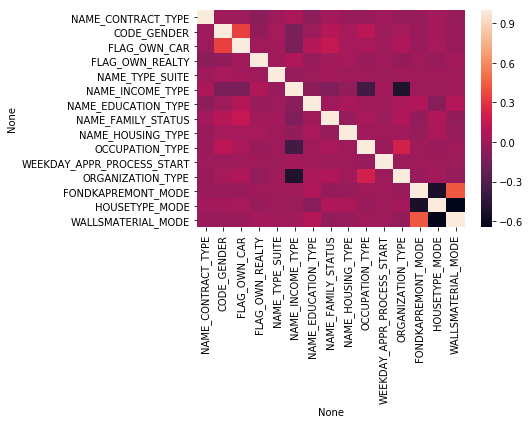

In [244]:
sns.heatmap(df_attr_obj.corr())

In [245]:
threshold = 0.9
corr_matrix = df_attr_obj.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
list_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
list_to_drop

[]

In [232]:
df_application.drop(columns=['EMERGENCYSTATE_MODE'], inplace=True)
df_test.drop(columns=['EMERGENCYSTATE_MODE'], inplace=True)

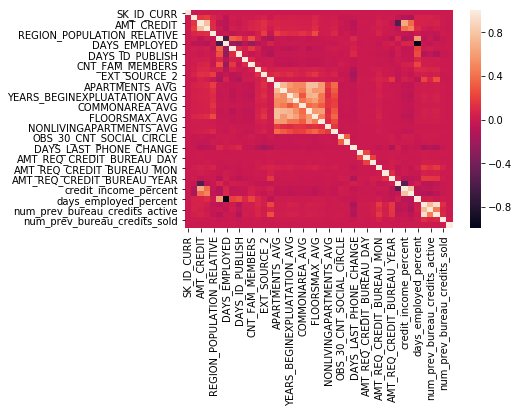

In [246]:
sns.heatmap(df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET']).corr())

In [247]:
corr_matrix = df_application[categorical_feat_int].corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
list_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
list_to_drop

[]

In [248]:
threshold = 0.9
corr_matrix = df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET']).corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
list_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
list_to_drop

['days_employed_percent', 'num_prev_bureau_credits_closed']

In [249]:
df_application.drop(columns=list_to_drop, inplace=True)
df_test.drop(columns=list_to_drop, inplace=True)

In [250]:
df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET', 'SK_ID_CURR']).shape

(307511, 39)

In [251]:
hg_attr_int.shape

(3, 307511)

In [252]:
hg_attr_obj.shape

(15, 307511)

In [253]:
binary_attr.shape

(31, 307511)

In [254]:
39+18+32

89

# X, y: sample for learning 

In [176]:
min_max = lambda x: (x-x.min())/(x.max()-x.min())

In [255]:
X = np.hstack([df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET', 'SK_ID_CURR']).transform(min_max).values, hg_attr_obj.T, hg_attr_int.T, binary_attr.T])
y = df_application.TARGET.copy()
#X = np.hstack([df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET', 'SK_ID_CURR']).transform(min_max).values, 
#               np.apply_along_axis(min_max,0,label_attr_obj.T), np.apply_along_axis(min_max,0,label_attr_int.T), binary_attr.T])

# ================ TEST ====================
X_t = np.hstack([df_test.drop(columns = categorical_feat_obj + categorical_feat_int + ['SK_ID_CURR']).transform(min_max).values, hg_attr_obj_test.T, hg_attr_int_test.T, binary_attr_test.T])


In [270]:
X.shape

(307511, 88)

In [95]:
label_attr_int

array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 1,  0,  1, ...,  2,  1,  0],
       [10, 11,  9, ...,  9,  9, 20]])

In [268]:
categorical =  categorical_feat_obj + [col for col in categorical_feat_int if df_application[col].nunique()>=2]
feat_vocab = df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET', 'SK_ID_CURR']).columns.tolist() + categorical

In [269]:
len(feat_vocab)

88

In [108]:
df_application.drop(columns = categorical_feat_obj + categorical_feat_int + ['TARGET', 'SK_ID_CURR']).shape

(307511, 39)

# PCA

In [259]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

pca = PCA(n_components=2)

X_pca = pca.fit_transform(X)


In [260]:
pca.explained_variance_ratio_

array([0.18111518, 0.12796129])

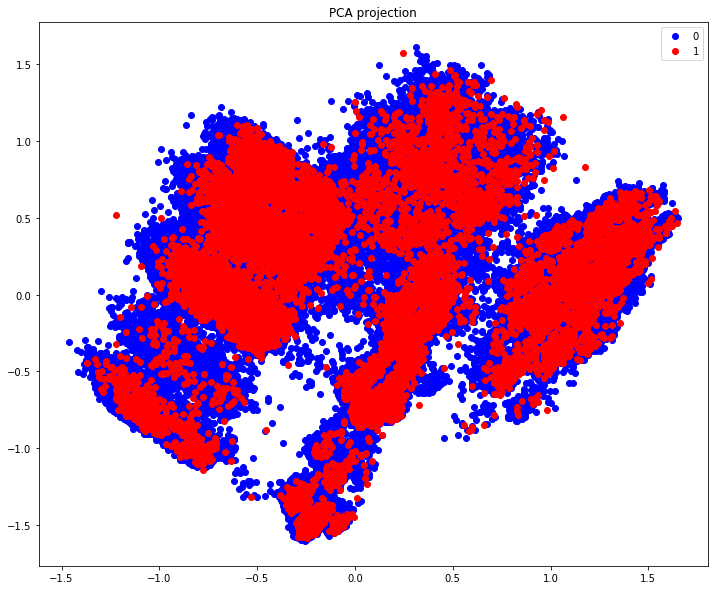

In [261]:
plt.figure(figsize=(12,10))
#plt.scatter(X_pca[:, 0], X_pca[:, 1], c = y.values,
#            edgecolor='none', alpha=0.7, #s=40,
#            cmap=plt.cm.get_cmap('flag', 10))
#plt.colorbar()
plt.plot(X_pca[y == 0, 0], X_pca[y == 0, 1], 'bo', label=0)
plt.plot(X_pca[y == 1, 0], X_pca[y == 1, 1], 'ro', label=1)
plt.title('PCA projection')
plt.legend(loc=0);

In [260]:
X_pca[y == 1].shape

(24825, 2)

In [262]:
pca = PCA(n_components=3)

X_pca = pca.fit_transform(X_scale)

NameError: name 'X_scale' is not defined

In [263]:
#def matplotlib_to_plotly(cmap, pl_entries):
    h = 1.0/(pl_entries-1)
    pl_colorscale = []
    
    for k in range(pl_entries):
        C = map(np.uint8, np.array(cmap(k*h)[:2])*255)
        pl_colorscale.append([k*h, 'rgb'+str((C[0], C[1]))])
        
    return pl_colorscale

trace = go.Scatter3d(x=X_pca[:, 0], y=X_pca[:, 1], z=X_pca[:, 2], 
                     mode='markers',
                     marker=dict(color=y, 
                                 #colorscale=[[0,'red'], [1, 'blue']],
                                 #colorscale=matplotlib_to_plotly(plt.cm.division, 5),
                                 line=dict(color='black', width=1))
                     )

layout = go.Layout(scene=
                   dict(
                        xaxis=dict(ticks='', showticklabels=False),
                        yaxis=dict(ticks='', showticklabels=False),
                        zaxis=dict(ticks='', showticklabels=False),
                       )
                  )

fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

IndentationError: unexpected indent (<ipython-input-263-b699f0491352>, line 2)

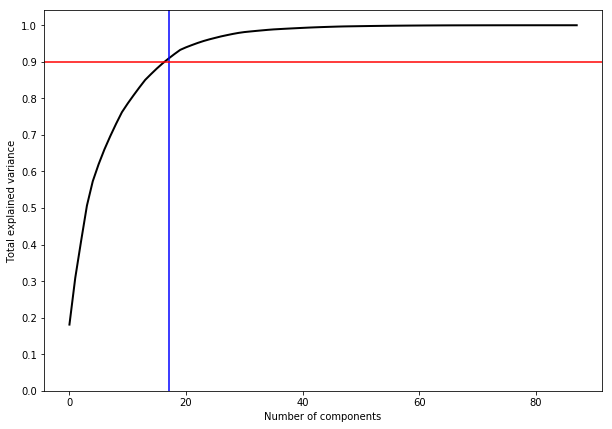

In [264]:
pca = PCA().fit(X)

plt.figure(figsize=(10,7))
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='k', lw=2)
plt.xlabel('Number of components')
plt.ylabel('Total explained variance')
#plt.xlim(0, 63)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axvline(np.argwhere(np.cumsum(pca.explained_variance_ratio_)>0.9)[0], c='b')
plt.axhline(0.9, c='r')
plt.show();
#print('\n', np.argwhere(np.cumsum(pca.explained_variance_ratio_)>0.9)[0])

In [265]:
 np.argwhere(np.cumsum(pca.explained_variance_ratio_)>0.9)[0][0]

17

# KMeans

CPU times: user 20min 20s, sys: 10min 5s, total: 30min 25s
Wall time: 18min 43s


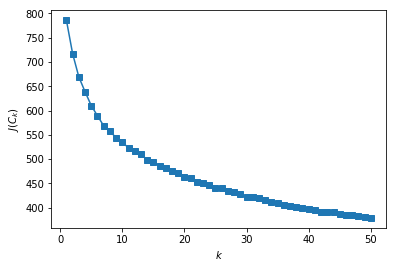

In [54]:
%%time

from sklearn.cluster import KMeans

n_comp = 16
class_range = 51
X_prepca = PCA(n_components=n_comp).fit_transform(X)

inertia = []
for k in range(1, class_range):
    kmeans = KMeans(n_clusters=k, random_state=17).fit(X_prepca)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, class_range), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$');

In [53]:
from sklearn.cluster import KMeans

n_comp = 16

X_prepca = PCA(n_components=n_comp).fit_transform(X)

kmeans = KMeans(n_clusters=50, random_state=17).fit(X_prepca)

In [54]:
kmeans.labels_

array([23, 23, 48, ..., 22, 10, 49], dtype=int32)

In [55]:
df_application['KMeans'] = kmeans.labels_

In [ ]:
%%time 

from sklearn.manifold import TSNE
tsne = TSNE(n_components=3, random_state=17)

X_tsne3 = tsne.fit_transform(X_scale)

In [ ]:
trace = go.Scatter3d(x=X_tsne3[:, 0], y=X_tsne3[:, 1], z=X_tsne3[:, 2], 
                     mode='markers',
                     marker=dict(color=X.Type, 
                                 #colorscale=[[0,'red'], [1, 'blue']],
                                 #colorscale=matplotlib_to_plotly(plt.cm.division, 5),
                                 line=dict(color='black', width=1))
                     )

layout = go.Layout(scene=
                   dict(
                        xaxis=dict(ticks='', showticklabels=False),
                        yaxis=dict(ticks='', showticklabels=False),
                        zaxis=dict(ticks='', showticklabels=False),
                       )
                  )

fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

In [165]:
df_application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,apartment_flag,KMeans,num_prev_bureau_credits,num_prev_bureau_credits_active,num_prev_bureau_credits_sold,num_prev_bureau_credits_bad
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,0.0,1,0,1,1,0,Laborers,1.0,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.024700,0.036900,0.972200,0.619200,0.014300,0.069000,0.083300,0.036900,0.00000,0.000000,reg oper account,block of flats,"Stone, brick",No,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1,23,8,2,0,0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,0.0,1,0,1,1,0,Core staff,2.0,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,0.000000,0.095900,0.052900,0.985100,0.796000,0.060500,0.034500,0.291700,0.013000,0.00390,0.009800,reg oper account,block of flats,Block,No,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1,23,4,1,0,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,0,Laborers,1.0,2,MONDAY,9,0,0,0,0,0,0,Government,0.000000,0.555912,0.729567,0.118314,0.088952,0.977893,0.753153,0.045005,0.150249,0.228023,0.066575,0.00885,0.028615,Undefined,Undefined,Undefined,Undefined,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,48,2,0,0,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,0.0,1,0,1,0,0,Laborers,2.0,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.000000,0.650442,0.000000,0.118314,0.088952,0.977893,0.753153,0.045005,0.150249,0.228023,0.066575,0.00885,0.028615,Undefined,Undefined,Undefined,Undefined,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,29,0,0,0,0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,0.0,1,0,1,0,0,Core staff,1.0,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.000000,0.322738,0.000000,0.118314,0.088952,0.977893,0.753153,0.045005,0.150249,0.228023,0.066575,0.00885,0.028615,Undefined,Unde

# LightGBM

In [274]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.10, random_state=23)

In [275]:
import lightgbm as lgb

lgbm_params =  {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'metric': 'auc',
    'max_depth': 5,
    'num_leaves': 25,
    'feature_fraction': 0.7,
    'bagging_fraction': 0.8,
#     'bagging_freq': 5,
    'learning_rate': 0.005,
    'verbose': 0
}

lgtrain = lgb.Dataset(X_train, y_train,
                      feature_name=feat_vocab,
                      categorical_feature = categorical)
lgvalid = lgb.Dataset(X_valid, y_valid,
                     feature_name=feat_vocab,
                     categorical_feature = categorical)

In [276]:
X_train.shape

(276759, 88)

In [277]:
lgb_clf = lgb.train(
    lgbm_params,
    lgtrain,
    num_boost_round=5000,
    valid_sets=[lgtrain, lgvalid],
    valid_names=['train','valid'],
    early_stopping_rounds=200,
    verbose_eval=200
)

Training until validation scores don't improve for 200 rounds.
[200]	train's auc: 0.738929	valid's auc: 0.729285
[400]	train's auc: 0.747807	valid's auc: 0.736355
[600]	train's auc: 0.754689	valid's auc: 0.74099
[800]	train's auc: 0.761221	valid's auc: 0.745523
[1000]	train's auc: 0.765983	valid's auc: 0.748307
[1200]	train's auc: 0.770123	valid's auc: 0.750156
[1400]	train's auc: 0.773576	valid's auc: 0.751489
[1600]	train's auc: 0.776605	valid's auc: 0.752592
[1800]	train's auc: 0.779268	valid's auc: 0.753554
[2000]	train's auc: 0.781706	valid's auc: 0.75439
[2200]	train's auc: 0.783907	valid's auc: 0.755018
[2400]	train's auc: 0.786053	valid's auc: 0.755752
[2600]	train's auc: 0.788131	valid's auc: 0.756193
[2800]	train's auc: 0.790112	valid's auc: 0.756588
[3000]	train's auc: 0.792117	valid's auc: 0.756979
[3200]	train's auc: 0.794099	valid's auc: 0.757356
[3400]	train's auc: 0.796065	valid's auc: 0.757637
[3600]	train's auc: 0.798082	valid's auc: 0.75796
[3800]	train's auc: 0.7999

Text(0.5,1,'Light GBM Feature Importance')

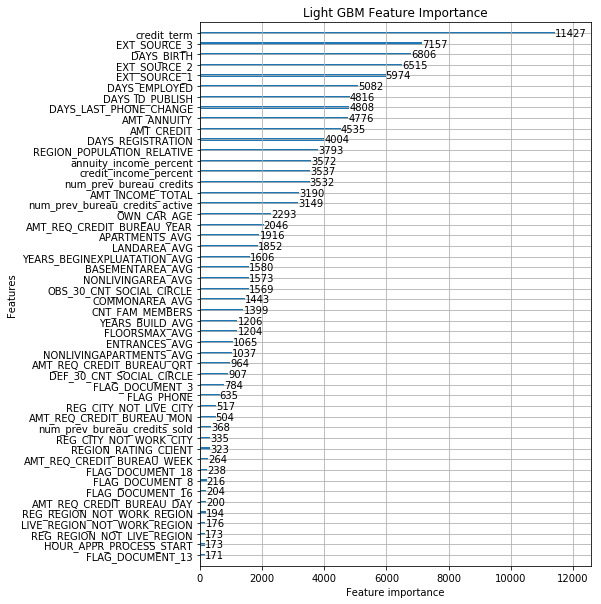

In [278]:
f, ax = plt.subplots(figsize=[7,10])

lgb.plot_importance(lgb_clf,max_num_features=50, ax=ax)
plt.title("Light GBM Feature Importance")

In [113]:
df_application['AMT_ANNUITY'].head()

0    24700.5
1    35698.5
2    6750.0 
3    29686.5
4    21865.5
Name: AMT_ANNUITY, dtype: float64

In [114]:
df_application.AMT_CREDIT.head()

0    406597.5 
1    1293502.5
2    135000.0 
3    312682.5 
4    513000.0 
Name: AMT_CREDIT, dtype: float64

In [279]:
def zero_importance_features(train, train_labels, tfvocab, categorical, iterations = 2):
       
    feature_importances = np.zeros(train.shape[1])

    model = lgb.LGBMClassifier(num_leaves=37, max_depth=5)
    
    # Fit the model multiple times to avoid overfitting
    for i in range(iterations):

        # Split into training and validation set
        train_features, valid_features, train_y, valid_y = train_test_split(train, train_labels, 
                                                                            test_size = 0.25, 
                                                                            random_state = 27)
        # Train using early stopping
        model.fit(train_features, train_y, early_stopping_rounds=100, 
                  eval_set = [(valid_features, valid_y)],
                  feature_name=tfvocab,
                  categorical_feature = categorical,
                  eval_metric = 'auc', verbose = 200)

        # Record the feature importances
        feature_importances += model.feature_importances_ / iterations
    
    feature_importances = pd.DataFrame({'feature': tfvocab, 
                            'importance': feature_importances}).sort_values('importance', 
                                                                            ascending = False)
    
    # Find the features with zero importance
    zero_features = list(feature_importances[feature_importances['importance'] == 0.0]['feature'])
    print('\nThere are %d features with 0.0 importance' % len(zero_features))
    
    return zero_features, feature_importances

In [280]:
feat_zero, feat_importances = zero_importance_features(X, y, feat_vocab, categorical, 10)

Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training until validation scores don't improve for 100 rounds.
Did not meet early stopping. Best iteration is:
[100]	valid_0's auc: 0.759566
Training unti

In [184]:
feat_zero

['FLAG_DOCUMENT_7',
 'num_prev_bureau_credits_bad',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'OCCUPATION_TYPE',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'NAME_CONTRACT_TYPE',
 'FLAG_DOCUMENT_2',
 'CODE_GENDER',
 'FLAG_CONT_MOBILE',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'CNT_CHILDREN',
 'FLAG_MOBIL',
 'FLAG_WORK_PHONE',
 'NAME_HOUSING_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_EMAIL',
 'NAME_FAMILY_STATUS',
 'REG_REGION_NOT_LIVE_REGION',
 'NAME_EDUCATION_TYPE',
 'NAME_TYPE_SUITE',
 'FLAG_OWN_REALTY',
 'FLAG_OWN_CAR',
 'NAME_INCOME_TYPE']

# Test

# Description of the bureau.csv features and preprocessing 

CREDIT_ACTIVE - apparently the most important feature

DAYS_CREDIT_ENDDATE (Remaining duration of CB credit (in days) at the time of application in Home Credit) - negative mostly(???) for closed credits and positive for active ones. 
Fill NaN by 0 

DAYS_ENDDATE_FACT (Days since CB credit ended at the time of application in Home Credit (only for closed credit) - in fact, sometimes not only for closed credits but for active ones too; could be filled by mean in the group (CREDIT_ACTIVE for instance); could be used the positive values for active credits? Removed due to high correlation with DAYS_CREDIT (0.88)

AMT_CREDIT_MAX_OVERDUE (Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample)) - do not understand what does it mean. Since NaN > 65% could be removed; or filled by 0

AMT_ANNUITY - could be removed since > 70% of NaN

In [36]:
df_bureau = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/bureau.csv.zip')

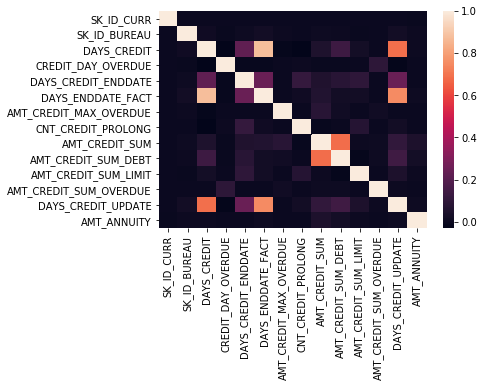

In [37]:
sns.heatmap(df_bureau.corr())

In [38]:
threshold = 0.8

corr_matrix = df_bureau.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
list_to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
list_to_drop

['DAYS_ENDDATE_FACT']

In [39]:
df_miss_bureau = missing_data(df_bureau)
df_miss_bureau

,Total,Percent
AMT_ANNUITY,1226791,71.473490
AMT_CREDIT_MAX_OVERDUE,1124488,65.513264
DAYS_ENDDATE_FACT,633653,36.916958
AMT_CREDIT_SUM_LIMIT,591780,34.477415
AMT_CREDIT_SUM_DEBT,257669,15.011932
DAYS_CREDIT_ENDDATE,105553,6.149573
AMT_CREDIT_SUM,13,0.000757
CREDIT_TYPE,0,0.000000
AMT_CREDIT_SUM_OVERDUE,0,0.000000
CNT_CREDIT_PROLONG,0,0.000000


In [40]:
df_bureau.nunique()

SK_ID_CURR                305811 
SK_ID_BUREAU              1716428
CREDIT_ACTIVE             4      
CREDIT_CURRENCY           4      
DAYS_CREDIT               2923   
CREDIT_DAY_OVERDUE        942    
DAYS_CREDIT_ENDDATE       14096  
DAYS_ENDDATE_FACT         2917   
AMT_CREDIT_MAX_OVERDUE    68251  
CNT_CREDIT_PROLONG        10     
AMT_CREDIT_SUM            236708 
AMT_CREDIT_SUM_DEBT       226537 
AMT_CREDIT_SUM_LIMIT      51726  
AMT_CREDIT_SUM_OVERDUE    1616   
CREDIT_TYPE               15     
DAYS_CREDIT_UPDATE        2982   
AMT_ANNUITY               40321  
dtype: int64

In [41]:
bureau_categorical_obj = df_bureau.columns[df_bureau.dtypes == 'object']

In [63]:
for col in bureau_categorical_obj.tolist() + ['CNT_CREDIT_PROLONG']:
    target  =  df_bureau[col].value_counts().reset_index()
    target.columns  = [col,"count"]
    
    trace1 = go.Bar(x = target[col]  , y = target["count"],
                name = "Target Zero",
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

    
    layout = go.Layout(dict(title = "Distribution in " + col + ' group',
                        plot_bgcolor  = "rgb(243,243,243)",paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = col + " group",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = "count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
    data = [trace1]
    fig  = go.Figure(data=data,layout=layout)
    py.iplot(fig)

In [44]:
df_miss_bureau

,Total,Percent
AMT_ANNUITY,1226791,71.473490
AMT_CREDIT_MAX_OVERDUE,1124488,65.513264
DAYS_ENDDATE_FACT,633653,36.916958
AMT_CREDIT_SUM_LIMIT,591780,34.477415
AMT_CREDIT_SUM_DEBT,257669,15.011932
DAYS_CREDIT_ENDDATE,105553,6.149573
AMT_CREDIT_SUM,13,0.000757
CREDIT_TYPE,0,0.000000
AMT_CREDIT_SUM_OVERDUE,0,0.000000
CNT_CREDIT_PROLONG,0,0.000000


In [45]:
fillna_dic = {'DAYS_CREDIT_ENDDATE':0,'AMT_CREDIT_MAX_OVERDUE':0,}
remove_list = ['AMT_ANNUITY','DAYS_ENDDATE_FACT','AMT_CREDIT_SUM_LIMIT','AMT_CREDIT_SUM_DEBT','AMT_CREDIT_SUM']

In [46]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [67]:
print(df_application['SK_ID_CURR'].nunique(), df_bureau['SK_ID_CURR'].nunique())

307511 305811


In [47]:
prev_bureau_dict = dict(df_bureau.groupby('SK_ID_CURR')['SK_ID_BUREAU'].count())

In [216]:
df_application['num_prev_bureau_credits'] = df_application['SK_ID_CURR'].map(lambda x: prev_bureau_dict[x] if x in prev_bureau_dict else 0).astype('int64')
df_test['num_prev_bureau_credits'] = df_test['SK_ID_CURR'].map(lambda x: prev_bureau_dict[x] if x in prev_bureau_dict else 0).astype('int64')

In [71]:
col = 'num_prev_bureau_credits'
target  =  df_application[col].value_counts().reset_index()
target.columns  = [col,"count"]
   
trace1 = go.Bar(x = target[col]  , y = target["count"],
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

    
layout = go.Layout(dict(title = "Distribution in " + col + ' group',
                        plot_bgcolor  = "rgb(243,243,243)",paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = col + " group",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = "count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
data = [trace1]
fig  = go.Figure(data=data,layout=layout)
py.iplot(fig)

In [49]:
c = dict(df_bureau.groupby(['SK_ID_CURR', 'CREDIT_ACTIVE'])['SK_ID_BUREAU'].count())

In [50]:
df_bureau['CREDIT_ACTIVE'].unique()

array(['Closed', 'Active', 'Sold', 'Bad debt'], dtype=object)

In [217]:
df_application['num_prev_bureau_credits_active'] = df_application['SK_ID_CURR'].map(lambda x: c[x, 'Active'] if (x, 'Active') in c else 0).astype('int64')
df_application['num_prev_bureau_credits_closed'] = df_application['SK_ID_CURR'].map(lambda x: c[x, 'Closed'] if (x, 'Closed') in c else 0).astype('int64')
df_application['num_prev_bureau_credits_sold'] = df_application['SK_ID_CURR'].map(lambda x: c[x, 'Sold'] if (x, 'Sold') in c else 0).astype('int64')
df_application['num_prev_bureau_credits_bad'] = df_application['SK_ID_CURR'].map(lambda x: c[x, 'Bad debt'] if (x, 'Bad debt') in c else 0).astype('int64')

In [218]:
df_test['num_prev_bureau_credits_active'] = df_test['SK_ID_CURR'].map(lambda x: c[x, 'Active'] if (x, 'Active') in c else 0).astype('int64')
df_test['num_prev_bureau_credits_closed'] = df_test['SK_ID_CURR'].map(lambda x: c[x, 'Closed'] if (x, 'Closed') in c else 0).astype('int64')
df_test['num_prev_bureau_credits_sold'] = df_test['SK_ID_CURR'].map(lambda x: c[x, 'Sold'] if (x, 'Sold') in c else 0).astype('int64')
df_test['num_prev_bureau_credits_bad'] = df_test['SK_ID_CURR'].map(lambda x: c[x, 'Bad debt'] if (x, 'Bad debt') in c else 0).astype('int64')

In [ ]:
bureau_float_list = [x for x in df_bureau.columns if df_bureau[x].dtype != 'object']
bureau_float_list

In [75]:
for col in ['num_prev_bureau_credits_active','num_prev_bureau_credits_closed','num_prev_bureau_credits_sold','num_prev_bureau_credits_bad']:
    target  =  df_tes[col].value_counts().reset_index()
    target.columns  = [col,"count"]
   
    trace1 = go.Bar(x = target[col]  , y = target["count"],
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

    
    layout = go.Layout(dict(title = "Distribution in " + col + ' group',
                        plot_bgcolor  = "rgb(243,243,243)",paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = col + " group",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = "count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
    data = [trace1]
    fig  = go.Figure(data=data,layout=layout)
    py.iplot(fig)

In [ ]:
sns.heatmap(df_bureau[bureau_float_list].corr())

In [543]:
df_bureau[['DAYS_CREDIT','DAYS_ENDDATE_FACT','DAYS_CREDIT_UPDATE']].corr()

,DAYS_CREDIT,DAYS_ENDDATE_FACT,DAYS_CREDIT_UPDATE
DAYS_CREDIT,1.000000,0.875359,0.688771
DAYS_ENDDATE_FACT,0.875359,1.000000,0.751294
DAYS_CREDIT_UPDATE,0.688771,0.751294,1.000000


In [635]:
df_bureau[df_bureau['AMT_CREDIT_MAX_OVERDUE']>0].describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,121290.000000,1.212900e+05,121290.000000,121290.000000,111218.000000,79549.000000,1.212900e+05,121290.000000,1.212900e+05,9.396300e+04,9.297100e+04,1.212900e+05,121290.000000,2.464800e+04
mean,277660.769321,5.895983e+06,-1439.269635,2.671737,61.938886,-1198.715081,1.866945e+04,0.038552,3.573691e+05,9.366178e+04,1.350024e+04,1.044908e+02,-785.090106,1.790062e+04
std,102849.892464,5.340870e+05,838.454565,66.360769,3433.299138,795.419380,4.548529e+05,0.237296,9.434652e+05,4.006334e+05,5.835410e+04,6.817232e+03,819.593560,9.302870e+04
min,100002.000000,5.000001e+06,-2922.000000,0.000000,-42060.000000,-2873.000000,4.500000e-02,0.000000,0.000000e+00,-2.250047e+05,-5.864061e+05,0.000000e+00,-2849.000000,0.000000e+00
25%,188353.750000,5.427744e+06,-2252.000000,0.000000,-1655.000000,-1935.000000,3.546225e+03,0.000000,5.075550e+04,0.000000e+00,0.000000e+00,0.000000e+00,-1380.000000,0.000000e+00
50%,277548.000000,5.875908e+06,-1303.000000,0.000000,-555.000000,-1063.000000,7.374060e+03,0.000000,1.284421e+05,0.000000e+00,0.000000e+00,0.000000e+00,-515.000000,8.500252e+03
75%,366253.000000,6.360045e+06,-711.000000,0.000000,280.000000,-497.000000,1.395900e+04,0.000000,3.197452e+05,5.217007e+03,0.000000e+00,0.000000e+00,-35.000000,2.160450e+04
max,456255.000000,6.843420e+06,-24.000000,2667.000000,31183.000000,-2.000000,1.159872e+08,9.000000,1.009980e+08,2.972159e+07,2.045368e+06,1.224475e+06,0.000000,7.702353e+06


In [534]:
df_bureau[df_bureau['AMT_ANNUITY'].isna()]['CREDIT_ACTIVE'].describe()

count     1226791
unique    4      
top       Closed 
freq      790651 
Name: CREDIT_ACTIVE, dtype: object

In [ ]:
df_bureau[df_bureau['DAYS_CREDIT_ENDDATE']<0]['CREDIT_ACTIVE'].describe()

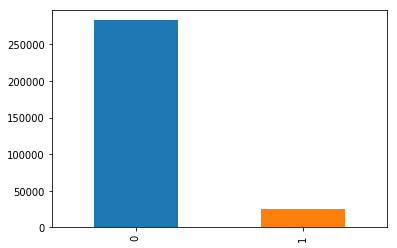

In [10]:
df_application['TARGET'].value_counts().plot(kind = 'bar', label = 'Target distribution')


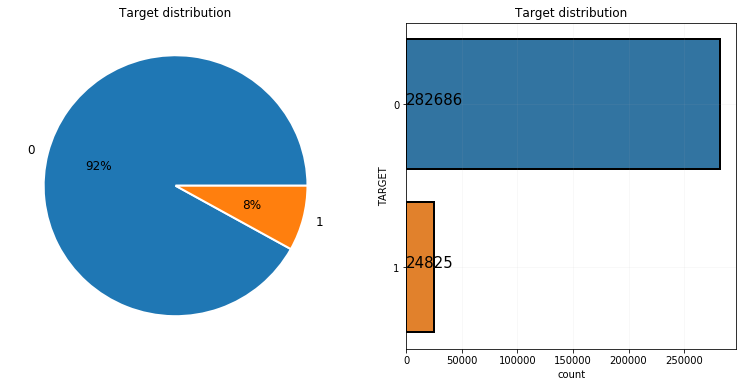

In [11]:
plt.figure(figsize=(13,6))
plt.subplot(121)
df_application["TARGET"].value_counts().plot.pie(autopct  = "%1.0f%%",
                                        fontsize = 12,
                                        wedgeprops = {"linewidth" : 2,
                                                      "edgecolor" : "w"},
                                       )
plt.title("Target distribution")
plt.ylabel("")

plt.subplot(122)
ax = sns.countplot(y = df_application["TARGET"],linewidth = 2,
                   edgecolor = "k"*df_application["TARGET"].nunique())
for i,j in enumerate(df_application["TARGET"].value_counts().values) : 
    ax.text(.1,i,j,fontsize = 15,color = "k")
plt.title("Target distribution")
plt.grid(True,alpha = .1)
    
plt.show()

In [282]:
def bar_plot(df, column):

    target_zero  =  df_application[df_application['TARGET']==0][column].value_counts().reset_index()
    target_zero.columns  = [column,"count"]
    target_one =  df_application[df_application['TARGET']==1][column].value_counts().reset_index()
    target_one.columns = [column,"count"]


    trace1 = go.Bar(x = target_zero[column]  , y = target_zero["count"],
                name = "Target Zero",
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

#bar - not churn
    trace2 = go.Bar(x = target_one[column] , y = target_one["count"],
                name = "Target One",
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

    layout = go.Layout(dict(title = "Target distribution in " + column + ' group',
                        plot_bgcolor  = "rgb(243,243,243)",paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = column + " group",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = "count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
    data = [trace1,trace2]
    fig  = go.Figure(data=data,layout=layout)
    py.iplot(fig)

In [13]:
df_application.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

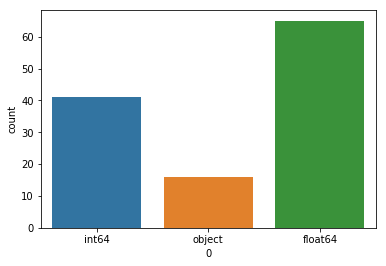

In [14]:

sns.countplot(x = 0, data=df_application.dtypes.to_frame())

In [283]:
small_cat_feat = list(df_application.columns[(df_application.dtypes == 'object') | ((df_application.dtypes == 'int64') & (df_application.nunique() < 30))].drop("TARGET"))

for col in small_cat_feat:
    bar_plot(col)

In [16]:
df_application[df_application.columns[df_application.dtypes=='object']].nunique()

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

In [17]:
df_application[df_application.columns[df_application.dtypes=='int64']].nunique()

SK_ID_CURR                     307511
TARGET                              2
CNT_CHILDREN                       15
DAYS_BIRTH                      17460
DAYS_EMPLOYED                   12574
DAYS_ID_PUBLISH                  6168
FLAG_MOBIL                          2
FLAG_EMP_PHONE                      2
FLAG_WORK_PHONE                     2
FLAG_CONT_MOBILE                    2
FLAG_PHONE                          2
FLAG_EMAIL                          2
REGION_RATING_CLIENT                3
REGION_RATING_CLIENT_W_CITY         3
HOUR_APPR_PROCESS_START            24
REG_REGION_NOT_LIVE_REGION          2
REG_REGION_NOT_WORK_REGION          2
LIVE_REGION_NOT_WORK_REGION         2
REG_CITY_NOT_LIVE_CITY              2
REG_CITY_NOT_WORK_CITY              2
LIVE_CITY_NOT_WORK_CITY             2
FLAG_DOCUMENT_2                     2
FLAG_DOCUMENT_3                     2
FLAG_DOCUMENT_4                     2
FLAG_DOCUMENT_5                     2
FLAG_DOCUMENT_6                     2
FLAG_DOCUMEN

In [28]:
def histogram(column) :
    trace1 = go.Histogram(x  = df_application[df_application['TARGET']==0][column],
                          histnorm= "percent",
                          name = "target = 0",
                          nbinsx = 20,
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
    trace2 = go.Histogram(x  = df_application[df_application['TARGET']==1][column],
                          histnorm = "percent",
                          name = "target = 1",
                          nbinsx = 20,
                          marker = dict(line = dict(width = .5,
                                              color = "black"
                                             )
                                 ),
                          opacity = .9
                         )
    
    data = [trace1,trace2]
    layout = go.Layout(dict(title =column + " distribution",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=20
                                            ),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                       
                        )
    fig  = go.Figure(data=data,layout=layout)
    
    py.iplot(fig)

In [32]:
num_feat = list(df_application.columns[(df_application.dtypes == 'float64') | ((df_application.dtypes == 'int64') & (df_application.nunique() > 30))].drop('SK_ID_CURR'))

In [36]:
histogram("AMT_CREDIT")

In [37]:
num_feat

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI'

In [ ]:
for col in num_feat:
    histogram(col)

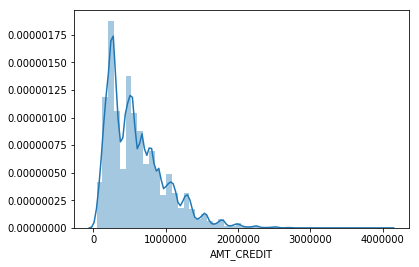

In [25]:
sns.distplot(df_application["AMT_CREDIT"], bins=50)

In [192]:
num_feat

['SK_ID_CURR',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 '

In [2]:
for col in num_feat:
    sns.distplot(df_application[col])

NameError: name 'num_feat' is not defined

In [20]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [21]:
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [24]:
df_bureau_balance.STATUS.unique()

array(['C', '0', 'X', '1', '2', '3', '5', '4'], dtype=object)

In [ ]:
df_bureau = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/bureau.csv.zip')
df_bureau_balance = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/bureau_balance.csv.zip')

In [17]:
df_bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
SK_ID_CURR                int64
SK_ID_BUREAU              int64
CREDIT_ACTIVE             object
CREDIT_CURRENCY           object
DAYS_CREDIT               int64
CREDIT_DAY_OVERDUE        int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG        int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE               object
DAYS_CREDIT_UPDATE        int64
AMT_ANNUITY               float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [18]:
df_bureau_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
SK_ID_BUREAU      int64
MONTHS_BALANCE    int64
STATUS            object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [25]:
df_pos = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/POS_CASH_balance.csv.zip')
df_pos.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [26]:
df_pos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
SK_ID_PREV               int64
SK_ID_CURR               int64
MONTHS_BALANCE           int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS     object
SK_DPD                   int64
SK_DPD_DEF               int64
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [27]:
df_card = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/credit_card_balance.csv.zip')
df_card.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [28]:
df_card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
SK_ID_PREV                    int64
SK_ID_CURR                    int64
MONTHS_BALANCE                int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL       int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT          int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS          object
SK_DPD                        int64
SK_DPD_DEF                    int64
dtypes: float64(15), int64(7

In [29]:
df_prev = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/previous_application.csv.zip')
df_prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
df_prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
SK_ID_PREV                     1670214 non-null int64
SK_ID_CURR                     1670214 non-null int64
NAME_CONTRACT_TYPE             1670214 non-null object
AMT_ANNUITY                    1297979 non-null float64
AMT_APPLICATION                1670214 non-null float64
AMT_CREDIT                     1670213 non-null float64
AMT_DOWN_PAYMENT               774370 non-null float64
AMT_GOODS_PRICE                1284699 non-null float64
WEEKDAY_APPR_PROCESS_START     1670214 non-null object
HOUR_APPR_PROCESS_START        1670214 non-null int64
FLAG_LAST_APPL_PER_CONTRACT    1670214 non-null object
NFLAG_LAST_APPL_IN_DAY         1670214 non-null int64
RATE_DOWN_PAYMENT              774370 non-null float64
RATE_INTEREST_PRIMARY          5951 non-null float64
RATE_INTEREST_PRIVILEGED       5951 non-null float64
NAME_CASH_LOAN_PURPOSE         1670214 non-null object
NAME_CONTRA

In [31]:
df_installment = pd.read_csv('/home/biclast/data_hdd_ln/dataset/homecredit/installments_payments.csv.zip')
df_installment.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [32]:
df_installment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
SK_ID_PREV                int64
SK_ID_CURR                int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER     int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [33]:
df_installment.nunique()

SK_ID_PREV                997752
SK_ID_CURR                339587
NUM_INSTALMENT_VERSION        65
NUM_INSTALMENT_NUMBER        277
DAYS_INSTALMENT             2922
DAYS_ENTRY_PAYMENT          3039
AMT_INSTALMENT            902539
AMT_PAYMENT               944235
dtype: int64